In [48]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from hloc import extract_features, match_features, reconstruction, visualization

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Setup
In this notebook, we will run SfM reconstruction from scratch on a set of images. 

In [49]:
camera_configs = {
    'iphone8plus': {
        'f': 28, 
        'mu_m': 1.22
    },
    'iphone12mini': {
        'f': 26,
        'mu_m': 1.4     
    }
}

In [101]:
dataset_name = 'room'
camera_conf = camera_configs['iphone12mini']

dataset = Path(f'datasets/{dataset_name}/')
images = dataset / 'database/'
query = dataset / 'query'

outputs = Path(f'outputs/{dataset_name}')
sfm_pairs = outputs / 'sfm' 
sfm_dir = sfm_pairs / 'sfm_superpoint+superglue'
pairs = Path(f'pairs/{dataset_name}/')

database_list_path = dataset / 'database_list.txt'
query_list_path = dataset / 'query_list.txt'


local_feature_conf = extract_features.confs['superpoint_inloc']
global_feature_conf = extract_features.confs['netvlad']
matcher_conf = match_features.confs['superglue']

loc_pairs = pairs / f'pair_query_{dataset_name}.txt'

#to perform localization only (after all the features have been calculated)
local_feature_path = outputs / 'feats-superpoint-n4096-r1600.h5'
match_path = outputs / f'feats-superpoint-n4096-r1600_matches-superglue_pair_query_{dataset_name}.h5'

## Extract local features

In [51]:
local_feature_path = extract_features.main(local_feature_conf, images, sfm_pairs)

[12/17/2021 20:44:37 INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 4},
 'output': 'feats-superpoint-n4096-r1600',
 'preprocessing': {'grayscale': True, 'resize_max': 1600}}
[12/17/2021 20:44:37 INFO] Found 71 images in root datasets/uni/database.
Loaded SuperPoint model


  0%|                                                                                                                                                                               | 0/71 [00:00<?, ?it/s]/home/lizka/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 71/71 [02:34<00:00,  2.18s/it]

[12/17/2021 20:47:12 INFO] Finished exporting features.


## Exhaustive matching
Since the dataset is small, we can match all $\frac{n(n-1)}{2}$ images pairs. To do so, we pass the argument `exhaustive=True` and make sure that the pair file does not exist yet. If your dataset is larger, exhaustive matching might take a long time - consider selecting fewer pairs using image retrieval and `hloc/pairs_from_retrieval.py`.

In [59]:
match_path = match_features.main(
    matcher_conf, sfm_pairs / 'pairs-exhaustive.txt', local_feature_conf['output'], sfm_pairs, exhaustive=True)

[12/17/2021 20:53:28 INFO] Matching local features with configuration:
{'model': {'name': 'superglue', 'sinkhorn_iterations': 50, 'weights': 'indoor'},
 'output': 'matches-superglue'}
[12/17/2021 20:53:28 INFO] Writing exhaustive match pairs to outputs/uni/sfm/pairs_exhaustive.txt.
Loaded SuperGlue model ("indoor" weights)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2485/2485 [1:29:56<00:00,  2.17s/it]

[12/17/2021 22:23:24 INFO] Finished exporting matches.


## SfM reconstruction
Run COLMAP on the features and matches.

In [64]:
#reconstruction.main(sfm_dir, images, sfm_pairs / 'pairs-exhaustive.txt', local_feature_path, match_path, single_camera=True, verbose=True)

[12/17/2021 22:26:23 WARNING] The database already exists, deleting it.
[12/17/2021 22:26:23 INFO] Creating an empty database...
[12/17/2021 22:26:23 INFO] Importing images into the database...

Feature import

Processing file [1/71]
  Features:       0
Processing file [2/71]
  Features:       0
Processing file [3/71]
  Features:       0
Processing file [4/71]
  Features:       0
Processing file [5/71]
  Features:       0
Processing file [6/71]
  Features:       0
Processing file [7/71]
  Features:       0
Processing file [8/71]
  Features:       0
Processing file [9/71]
  Features:       0
Processing file [10/71]
  Features:       0
Processing file [11/71]
  Features:       0
Processing file [12/71]
  Features:       0
Processing file [13/71]
  Features:       0
Processing file [14/71]
  Features:       0
Processing file [15/71]
  Features:       0
Processing file [16/71]
  Features:       0
Processing file [17/71]
  Features:       0
Processing file [18/71]
  Features:       0
Proces

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 71/71 [00:00<00:00, 4538.18it/s]

[12/17/2021 22:26:27 INFO] Importing matches into the database...



100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2485/2485 [00:00<00:00, 5182.31it/s]

[12/17/2021 22:26:28 INFO] Performing geometric verification of the matches...



Custom feature matching

Matching block [1/25] in 2.309s
Matching block [2/25] in 1.441s
Matching block [3/25] in 2.111s
Matching block [4/25] in 1.723s
Matching block [5/25] in 2.067s
Matching block [6/25] in 1.962s
Matching block [7/25] in 2.293s
Matching block [8/25] in 2.474s
Matching block [9/25] in 2.542s
Matching block [10/25] in 1.735s
Matching block [11/25] in 1.836s
Matching block [12/25] in 1.936s
Matching block [13/25] in 1.730s
Matching block [14/25] in 2.635s
Matching block [15/25] in 2.267s
Matching block [16/25] in 2.188s
Matching block [17/25] in 3.466s
Matching block [18/25] in 3.362s
Matching block [19/25] in 2.017s
Matching block [20/25] in 2.008s
Matching block [21/25] in 2.573s
Matching block [22/25] in 2.288s
Matching block [23/25] in 2.572s
Matching block [24/25] in 2.600s
Matching block [25/25] in 1.974s
Elapsed time: 0.936 [minutes]
[12/17/2021 22:27:24 INFO] Running the reconstruction with command:
colmap mapper --database_path outputs/uni/sfm/sfm_superpoint

   6  1.734054e+03    1.19e-08    9.88e-03   3.41e-04   1.03e+00  7.29e+06        1    1.46e-02    2.56e-02


Bundle adjustment report
------------------------
    Residuals : 2746
   Parameters : 1752
   Iterations : 7
         Time : 0.0259049 [s]
 Initial cost : 0.803751 [px]
   Final cost : 0.794659 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 2
  => Changed observations: 0.001457

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.719649e+03    0.00e+00    8.80e+02   0.00e+00   0.00e+00  1.00e+04        0    4.94e-04    2.06e-03
   1  1.719053e+03    5.96e-01    3.66e+00   1.07e+00   1.00e+00  3.00e+04        1    1.53e-03    3.66e-03
   2  1.719012e+03    4.11e-02    3.86e+00   7.27e-01   9.96e-01  9.00e+04        1    1.64e-03    5.35e-03
   3  1.719007e+03    5.24e-03    1.23e+00   3.19e-01   9.94e-01  2.70e+05   


Pose refinement report
----------------------
    Residuals : 1108
   Parameters : 6
   Iterations : 19
         Time : 0.00860728 [s]
 Initial cost : 0.88256 [px]
   Final cost : 0.862827 [px]
  Termination : Convergence

  => Continued observations: 515
  => Added observations: 978

Bundle adjustment report
------------------------
    Residuals : 10438
   Parameters : 5181
   Iterations : 26
         Time : 0.168288 [s]
 Initial cost : 1.22543 [px]
   Final cost : 1.16823 [px]
  Termination : No convergence

  => Merged observations: 6
  => Completed observations: 11
  => Filtered observations: 956
  => Changed observations: 0.186434

Bundle adjustment report
------------------------
    Residuals : 8520
   Parameters : 4587
   Iterations : 3
         Time : 0.060095 [s]
 Initial cost : 0.886277 [px]
   Final cost : 0.830115 [px]
  Termination : Convergence

  => Merged observations: 18
  => Completed observations: 201
  => Filtered observations: 3
  => Changed observations: 0.0521



Bundle adjustment report
------------------------
    Residuals : 10694
   Parameters : 5817
   Iterations : 6
         Time : 0.0896284 [s]
 Initial cost : 0.860888 [px]
   Final cost : 0.858965 [px]
  Termination : Convergence

  => Merged observations: 1
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000187
  => Filtered images: 0

Registering image #48 (9)

  => Image sees 617 / 1338 points

Pose refinement report
----------------------
    Residuals : 946
   Parameters : 6
   Iterations : 33
         Time : 0.0142888 [s]
 Initial cost : 0.91801 [px]
   Final cost : 0.894992 [px]
  Termination : Convergence

  => Continued observations: 399
  => Added observations: 1155

Bundle adjustment report
------------------------
    Residuals : 11822
   Parameters : 4566
   Iterations : 26
         Time : 0.285579 [s]
 Initial cost : 1.26775 [px]
   Final cost : 1.11934 [px]
  Termination : No convergence

  => Merged observations: 26
  => Comple

   5  9.285955e+03    3.58e-05    3.50e-01   5.69e-03   1.01e+00  2.43e+06        1    1.99e-02    6.78e-02


Bundle adjustment report
------------------------
    Residuals : 12448
   Parameters : 6594
   Iterations : 6
         Time : 0.0682534 [s]
 Initial cost : 0.92319 [px]
   Final cost : 0.863701 [px]
  Termination : Convergence

  => Merged observations: 38
  => Completed observations: 8
  => Filtered observations: 21
  => Changed observations: 0.010765

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.318883e+03    0.00e+00    9.92e+03   0.00e+00   0.00e+00  1.00e+04        0    2.31e-03    9.64e-03
   1  9.202825e+03    1.16e+02    1.99e+02   1.79e+00   1.00e+00  3.00e+04        1    6.92e-03    1.67e-02
   2  9.202504e+03    3.21e-01    1.26e+01   5.21e-01   1.00e+00  9.00e+04        1    8.27e-03    2.50e-02
   3  9.202485e+03    1.83e-02    1.88e+00   1.29e-01   1.00e+00  2.70e+05 

  43  5.170887e+04    6.06e-05    5.72e+02   2.68e-05   1.00e+00  1.50e+08        1    8.48e-03    3.50e-01
  44  5.170887e+04    0.00e+00    5.72e+02   0.00e+00   0.00e+00  7.51e+07        1    9.46e-03    3.59e-01
  45  5.170887e+04    8.60e-05    8.95e+02   3.58e-05   1.00e+00  2.25e+08        1    7.35e-03    3.67e-01
  46  5.170887e+04    0.00e+00    8.95e+02   0.00e+00   0.00e+00  1.13e+08        1    4.71e-03    3.71e-01
  47  5.170886e+04    1.19e-04    1.39e+03   4.41e-05   1.00e+00  3.38e+08        1    8.68e-03    3.80e-01
  48  5.170886e+04    0.00e+00    1.39e+03   0.00e+00   0.00e+00  1.69e+08        1    4.64e-03    3.85e-01
  49  5.170886e+04    0.00e+00    1.39e+03   0.00e+00   0.00e+00  4.23e+07        1    4.78e-03    3.90e-01
  50  5.170886e+04    3.96e-05    4.33e+02   1.63e-05   1.00e+00  1.27e+08        1    1.35e-02    4.03e-01


Bundle adjustment report
------------------------
    Residuals : 14904
   Parameters : 7278
   Iterations : 51
         Time : 0.4037

   3  1.052605e+04    1.89e+00    2.95e+01   2.41e+00   1.00e+00  2.70e+05        1    8.10e-03    4.01e-02
   4  1.052603e+04    2.66e-02    1.98e+00   3.25e-01   1.00e+00  8.10e+05        1    2.83e-02    6.86e-02
   5  1.052603e+04    5.95e-05    4.08e-01   1.57e-02   1.01e+00  2.43e+06        1    7.21e-03    7.59e-02


Bundle adjustment report
------------------------
    Residuals : 14272
   Parameters : 7608
   Iterations : 6
         Time : 0.0762647 [s]
 Initial cost : 0.98928 [px]
   Final cost : 0.858796 [px]
  Termination : Convergence

  => Merged observations: 287
  => Completed observations: 23
  => Filtered observations: 31
  => Changed observations: 0.047786

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.166100e+04    0.00e+00    5.60e+03   0.00e+00   0.00e+00  1.00e+04        0    2.31e-03    1.01e-02
   1  1.104383e+04    6.17e+02    1.16e+02   3.70e+00   1.00e+00  3.00e+0

   5  1.110911e+04    8.47e-04    1.26e+00   5.33e-02   1.01e+00  2.43e+06        1    2.00e-02    7.58e-02
   6  1.110911e+04    5.71e-07    2.89e-02   1.22e-03   1.02e+00  7.29e+06        1    8.10e-03    8.40e-02


Bundle adjustment report
------------------------
    Residuals : 15140
   Parameters : 8349
   Iterations : 7
         Time : 0.0844584 [s]
 Initial cost : 1.00908 [px]
   Final cost : 0.856597 [px]
  Termination : Convergence

  => Merged observations: 394
  => Completed observations: 42
  => Filtered observations: 65
  => Changed observations: 0.066182

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.217367e+04    0.00e+00    1.10e+04   0.00e+00   0.00e+00  1.00e+04        0    2.58e-03    1.13e-02
   1  1.132192e+04    8.52e+02    2.03e+02   7.04e+00   9.99e-01  3.00e+04        1    9.14e-03    2.06e-02
   2  1.131755e+04    4.38e+00    4.86e+01   2.24e+00   1.00e+00  9.00e+0

  12  7.479810e+05    9.55e-01    1.66e+06   2.69e-02   8.98e-01  3.93e+06        1    1.99e-02    1.55e-01
  13  7.479804e+05    5.69e-01    2.90e+06   1.96e-02   8.59e-01  6.24e+06        1    2.01e-02    1.75e-01
  14  7.479801e+05    3.03e-01    3.02e+06   9.12e-03   8.90e-01  1.19e+07        1    1.20e-02    1.87e-01
  15  7.479800e+05    1.80e-01    4.71e+06   6.16e-03   8.69e-01  1.98e+07        1    1.73e-02    2.04e-01
  16  7.479799e+05    9.95e-02    5.56e+06   3.18e-03   8.84e-01  3.62e+07        1    1.17e-02    2.16e-01
  17  7.479798e+05    5.70e-02    8.23e+06   2.39e-03   8.67e-01  5.98e+07        1    1.81e-02    2.34e-01
  18  7.479798e+05    3.19e-02    9.43e+06   7.08e-03   8.88e-01  1.13e+08        1    1.16e-02    2.46e-01
  19  7.479798e+05    2.04e-02    2.65e+07   5.72e-02   7.94e-01  1.41e+08        1    1.26e-02    2.59e-01
  20  7.479798e+05    0.00e+00    2.65e+07   0.00e+00   0.00e+00  7.06e+07        1    7.75e-03    2.67e-01
  21  7.479797e+05    8.61e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.055150e+04    0.00e+00    1.29e+04   0.00e+00   0.00e+00  1.00e+04        0    2.65e-03    1.09e-02
   1  1.031966e+04    2.32e+02    5.67e+01   1.01e+00   1.00e+00  3.00e+04        1    8.45e-03    1.95e-02
   2  1.031950e+04    1.51e-01    2.11e+00   2.63e-01   1.00e+00  9.00e+04        1    7.72e-03    2.73e-02
   3  1.031950e+04    2.57e-03    1.96e+00   3.67e-02   1.00e+00  2.70e+05        1    1.13e-02    3.87e-02
   4  1.031950e+04    2.80e-05    2.06e-01   2.85e-03   1.00e+00  8.10e+05        1    7.52e-03    4.63e-02


Bundle adjustment report
------------------------
    Residuals : 14366
   Parameters : 7518
   Iterations : 5
         Time : 0.0466847 [s]
 Initial cost : 0.857016 [px]
   Final cost : 0.847542 [px]
  Termination : Convergence

  => Merged observations: 36
  => Completed observations: 0
  => Filtered observations: 11
  => Changed observations: 0.


Bundle adjustment report
------------------------
    Residuals : 11806
   Parameters : 4701
   Iterations : 26
         Time : 0.140556 [s]
 Initial cost : 1.23826 [px]
   Final cost : 1.08515 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 112
  => Filtered observations: 814
  => Changed observations: 0.156869

Bundle adjustment report
------------------------
    Residuals : 10268
   Parameters : 4305
   Iterations : 3
         Time : 0.0191032 [s]
 Initial cost : 0.930446 [px]
   Final cost : 0.87877 [px]
  Termination : Convergence

  => Merged observations: 43
  => Completed observations: 172
  => Filtered observations: 2
  => Changed observations: 0.042267

Registering image #22 (20)

  => Image sees 281 / 822 points

Pose refinement report
----------------------
    Residuals : 236
   Parameters : 6
   Iterations : 41
         Time : 0.00442871 [s]
 Initial cost : 0.966729 [px]
   Final cost : 0.958283 [px]
  Termination : Converge


Bundle adjustment report
------------------------
    Residuals : 13080
   Parameters : 4335
   Iterations : 26
         Time : 0.150968 [s]
 Initial cost : 1.16512 [px]
   Final cost : 1.00179 [px]
  Termination : No convergence

  => Merged observations: 10
  => Completed observations: 73
  => Filtered observations: 902
  => Changed observations: 0.150612

Bundle adjustment report
------------------------
    Residuals : 11348
   Parameters : 3711
   Iterations : 3
         Time : 0.0168051 [s]
 Initial cost : 0.939581 [px]
   Final cost : 0.896495 [px]
  Termination : Convergence

  => Merged observations: 19
  => Completed observations: 193
  => Filtered observations: 8
  => Changed observations: 0.038773

Registering image #43 (22)

  => Image sees 290 / 817 points

Pose refinement report
----------------------
    Residuals : 250
   Parameters : 6
   Iterations : 14
         Time : 0.00153972 [s]
 Initial cost : 0.946531 [px]
   Final cost : 0.936455 [px]
  Termination : Converg

  => Completed observations: 0
  => Filtered observations: 10
  => Changed observations: 0.001980
  => Filtered images: 0

Registering image #44 (23)

  => Image sees 234 / 688 points

Pose refinement report
----------------------
    Residuals : 252
   Parameters : 6
   Iterations : 19
         Time : 0.00214428 [s]
 Initial cost : 0.931429 [px]
   Final cost : 0.895282 [px]
  Termination : Convergence

  => Continued observations: 116
  => Added observations: 430

Bundle adjustment report
------------------------
    Residuals : 12638
   Parameters : 3723
   Iterations : 26
         Time : 0.134914 [s]
 Initial cost : 0.94158 [px]
   Final cost : 0.845207 [px]
  Termination : No convergence

  => Merged observations: 23
  => Completed observations: 72
  => Filtered observations: 501
  => Changed observations: 0.094319

Bundle adjustment report
------------------------
    Residuals : 11352
   Parameters : 3297
   Iterations : 3
         Time : 0.014945 [s]
 Initial cost : 0.948251 [p

  => Completed observations: 4
  => Filtered observations: 22
  => Changed observations: 0.009561

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.668750e+04    0.00e+00    5.61e+03   0.00e+00   0.00e+00  1.00e+04        0    3.75e-03    1.66e-02
   1  1.648925e+04    1.98e+02    1.75e+02   1.30e+00   1.00e+00  3.00e+04        1    1.68e-02    3.35e-02
   2  1.648812e+04    1.12e+00    8.51e+01   8.56e-01   1.01e+00  9.00e+04        1    1.16e-02    4.53e-02
   3  1.648802e+04    1.02e-01    1.55e+01   3.16e-01   1.03e+00  2.70e+05        1    3.56e-02    8.10e-02
   4  1.648802e+04    2.68e-03    1.76e+00   5.06e-02   1.06e+00  8.10e+05        1    1.43e-02    9.54e-02
   5  1.648802e+04    3.10e-05    1.49e+00   4.95e-03   1.09e+00  2.43e+06        1    1.21e-02    1.08e-01
   6  1.648802e+04    3.09e-07    1.36e-01   4.34e-04   1.10e+00  7.29e+06        1    1.19e-02    1.20e-01


Bundle ad

   1  1.759447e+04    7.45e+02    1.94e+03   2.39e+00   1.00e+00  3.00e+04        1    2.96e-02    5.06e-02
   2  1.757818e+04    1.63e+01    2.16e+03   1.15e+00   9.93e-01  9.00e+04        1    1.51e-02    6.60e-02
   3  1.757546e+04    2.71e+00    4.82e+02   6.46e-01   9.98e-01  2.70e+05        1    1.68e-02    8.30e-02
   4  1.757536e+04    1.05e-01    1.91e+01   1.49e-01   1.00e+00  8.10e+05        1    1.45e-02    9.76e-02
   5  1.757536e+04    5.98e-04    1.53e+00   1.20e-02   1.01e+00  2.43e+06        1    2.79e-02    1.26e-01
   6  1.757536e+04    7.64e-07    1.01e-01   3.75e-04   1.02e+00  7.29e+06        1    1.64e-02    1.42e-01


Bundle adjustment report
------------------------
    Residuals : 23882
   Parameters : 12513
   Iterations : 7
         Time : 0.142946 [s]
 Initial cost : 0.876319 [px]
   Final cost : 0.857861 [px]
  Termination : Convergence

  => Merged observations: 79
  => Completed observations: 10
  => Filtered observations: 15
  => Changed observations: 0

   7  4.639932e+05    2.78e-02    2.02e+01   1.06e-02   1.38e+00  2.19e+07        1    3.04e-02    1.63e-01
   8  4.639932e+05    6.09e-03    1.87e+01   6.45e-03   1.44e+00  6.56e+07        1    1.76e-02    1.81e-01
   9  4.639932e+05    1.51e-03    6.22e+00   2.82e-03   1.47e+00  1.97e+08        1    1.80e-02    1.99e-01
  10  4.639932e+05    3.90e-04    4.52e+00   1.63e-03   1.49e+00  5.90e+08        1    1.89e-02    2.18e-01
  11  4.639932e+05    1.02e-04    1.79e+00   7.67e-04   1.50e+00  1.77e+09        1    1.85e-02    2.37e-01
  12  4.639932e+05    2.68e-05    1.67e+00   4.23e-04   1.51e+00  5.31e+09        1    1.89e-02    2.56e-01
  13  4.639932e+05    7.06e-06    1.45e+00   2.06e-04   1.51e+00  1.59e+10        1    2.14e-02    2.77e-01
  14  4.639932e+05    1.86e-06    1.39e+00   1.10e-04   1.51e+00  4.78e+10        1    3.15e-02    3.09e-01
  15  4.639932e+05    4.91e-07    8.11e-01   5.48e-05   1.51e+00  1.43e+11        1    1.89e-02    3.28e-01


Bundle adjustment report
-

  => Completed observations: 19
  => Filtered observations: 845
  => Changed observations: 0.250216

Bundle adjustment report
------------------------
    Residuals : 5278
   Parameters : 2163
   Iterations : 3
         Time : 0.0116689 [s]
 Initial cost : 0.851084 [px]
   Final cost : 0.793056 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 149
  => Filtered observations: 3
  => Changed observations: 0.057598

Registering image #20 (33)

  => Image sees 293 / 631 points

Pose refinement report
----------------------
    Residuals : 358
   Parameters : 6
   Iterations : 22
         Time : 0.00347648 [s]
 Initial cost : 0.930103 [px]
   Final cost : 0.92068 [px]
  Termination : Convergence

  => Continued observations: 171
  => Added observations: 508

Bundle adjustment report
------------------------
    Residuals : 5804
   Parameters : 2163
   Iterations : 26
         Time : 0.0746081 [s]
 Initial cost : 1.31262 [px]
   Final cost : 1.21868 [


Bundle adjustment report
------------------------
    Residuals : 12586
   Parameters : 4731
   Iterations : 26
         Time : 0.157865 [s]
 Initial cost : 0.997563 [px]
   Final cost : 0.888869 [px]
  Termination : No convergence

  => Merged observations: 11
  => Completed observations: 54
  => Filtered observations: 686
  => Changed observations: 0.119339

Bundle adjustment report
------------------------
    Residuals : 11758
   Parameters : 4395
   Iterations : 4
         Time : 0.0240569 [s]
 Initial cost : 0.925537 [px]
   Final cost : 0.886818 [px]
  Termination : Convergence

  => Merged observations: 16
  => Completed observations: 148
  => Filtered observations: 3
  => Changed observations: 0.028406

Registering image #69 (35)

  => Image sees 377 / 1028 points

Pose refinement report
----------------------
    Residuals : 636
   Parameters : 6
   Iterations : 52
         Time : 0.0133993 [s]
 Initial cost : 0.817142 [px]
   Final cost : 0.794974 [px]
  Termination : Conve

   2  2.118084e+04    4.49e-01    2.90e+01   1.31e-01   1.01e+00  9.00e+04        1    7.17e-02    1.25e-01
   3  2.118082e+04    1.80e-02    2.11e+00   4.48e-02   1.01e+00  2.70e+05        1    9.73e-02    2.23e-01
   4  2.118082e+04    3.95e-04    1.14e+00   7.56e-03   1.01e+00  8.10e+05        1    1.22e-01    3.45e-01
   5  2.118082e+04    2.04e-06    1.28e-01   5.08e-04   1.03e+00  2.43e+06        1    8.63e-02    4.31e-01


Bundle adjustment report
------------------------
    Residuals : 28432
   Parameters : 14409
   Iterations : 6
         Time : 0.43286 [s]
 Initial cost : 0.87008 [px]
   Final cost : 0.863113 [px]
  Termination : Convergence

  => Merged observations: 51
  => Completed observations: 22
  => Filtered observations: 17
  => Changed observations: 0.006331

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.143377e+04    0.00e+00    4.40e+03   0.00e+00   0.00e+00  1.00e+04 

  10  7.220642e+05    7.44e-01    4.22e+02   1.14e+00   1.51e+00  3.99e+08        1    8.80e-02    3.77e-01
  11  7.220640e+05    2.21e-01    2.29e+02   6.53e-01   1.52e+00  1.20e+09        1    7.45e-02    4.51e-01
  12  7.220639e+05    6.42e-02    1.23e+02   3.62e-01   1.53e+00  3.59e+09        1    2.66e-02    4.78e-01
  13  7.220639e+05    1.84e-02    6.57e+01   1.97e-01   1.53e+00  1.08e+10        1    2.34e-02    5.02e-01
  14  7.220639e+05    5.25e-03    3.50e+01   1.06e-01   1.53e+00  3.23e+10        1    2.40e-02    5.26e-01
  15  7.220639e+05    1.49e-03    1.87e+01   5.69e-02   1.53e+00  9.69e+10        1    3.23e-02    5.58e-01
  16  7.220639e+05    4.22e-04    9.93e+00   3.03e-02   1.53e+00  2.91e+11        1    3.01e-02    5.89e-01
  17  7.220639e+05    1.19e-04    5.28e+00   1.62e-02   1.53e+00  8.72e+11        1    3.21e-02    6.21e-01
  18  7.220639e+05    3.38e-05    2.81e+00   8.60e-03   1.53e+00  2.62e+12        1    2.95e-02    6.50e-01
  19  7.220639e+05    9.55e-


Bundle adjustment report
------------------------
    Residuals : 8502
   Parameters : 3192
   Iterations : 26
         Time : 0.114601 [s]
 Initial cost : 1.05174 [px]
   Final cost : 0.986421 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 48
  => Filtered observations: 726
  => Changed observations: 0.182075

Bundle adjustment report
------------------------
    Residuals : 6706
   Parameters : 2556
   Iterations : 4
         Time : 0.0166189 [s]
 Initial cost : 0.914987 [px]
   Final cost : 0.852418 [px]
  Termination : Convergence

  => Merged observations: 22
  => Completed observations: 173
  => Filtered observations: 7
  => Changed observations: 0.060245

Retriangulation

  => Merged observations: 23
  => Completed observations: 9
  => Retriangulated observations: 2418

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.793712e+06    0.00e+00

  => Added observations: 882

Bundle adjustment report
------------------------
    Residuals : 17694
   Parameters : 6921
   Iterations : 26
         Time : 0.219096 [s]
 Initial cost : 0.900727 [px]
   Final cost : 0.868159 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 85
  => Filtered observations: 787
  => Changed observations: 0.098564

Bundle adjustment report
------------------------
    Residuals : 16202
   Parameters : 6570
   Iterations : 4
         Time : 0.0335727 [s]
 Initial cost : 0.920579 [px]
   Final cost : 0.883019 [px]
  Termination : Convergence

  => Merged observations: 9
  => Completed observations: 161
  => Filtered observations: 3
  => Changed observations: 0.021355

Registering image #32 (44)

  => Image sees 443 / 1814 points

Pose refinement report
----------------------
    Residuals : 494
   Parameters : 6
   Iterations : 21
         Time : 0.00460972 [s]
 Initial cost : 0.880049 [px]
   Final cost : 0.85166

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.917955e+04    0.00e+00    1.04e+04   0.00e+00   0.00e+00  1.00e+04        0    8.03e-03    3.55e-02
   1  2.903313e+04    1.46e+02    4.85e+01   2.69e-01   1.00e+00  3.00e+04        1    2.53e-02    6.10e-02
   2  2.903299e+04    1.42e-01    5.86e+00   7.00e-02   1.01e+00  9.00e+04        1    2.22e-02    8.34e-02
   3  2.903298e+04    1.01e-02    1.92e+00   2.59e-02   1.00e+00  2.70e+05        1    2.33e-02    1.07e-01
   4  2.903298e+04    4.26e-04    8.76e-01   6.31e-03   1.00e+00  8.10e+05        1    2.40e-02    1.31e-01


Bundle adjustment report
------------------------
    Residuals : 39436
   Parameters : 19557
   Iterations : 5
         Time : 0.132726 [s]
 Initial cost : 0.860187 [px]
   Final cost : 0.858024 [px]
  Termination : Convergence

  => Merged observations: 25
  => Completed observations: 5
  => Filtered observations: 5
  => Changed observations: 0.0

   4  3.241821e+04    3.71e-05    1.52e+00   9.05e-04   1.02e+00  8.10e+05        1    3.22e-02    1.50e-01
   5  3.241821e+04    8.81e-08    2.15e-01   3.83e-05   1.03e+00  2.43e+06        1    3.08e-02    1.81e-01


Bundle adjustment report
------------------------
    Residuals : 43872
   Parameters : 21453
   Iterations : 6
         Time : 0.182558 [s]
 Initial cost : 0.863912 [px]
   Final cost : 0.859609 [px]
  Termination : Convergence

  => Merged observations: 38
  => Completed observations: 19
  => Filtered observations: 14
  => Changed observations: 0.003237

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.257687e+04    0.00e+00    8.47e+03   0.00e+00   0.00e+00  1.00e+04        0    8.46e-03    3.65e-02
   1  3.242669e+04    1.50e+02    6.30e+01   5.36e-01   1.00e+00  3.00e+04        1    3.05e-02    6.72e-02
   2  3.242653e+04    1.66e-01    3.21e+00   5.85e-02   1.00e+00  9.00e+0

   3  3.400355e+04    9.16e-02    5.26e+00   5.27e-02   1.01e+00  2.70e+05        1    3.34e-02    1.37e-01
   4  3.400355e+04    1.18e-03    1.69e+00   8.03e-03   1.01e+00  8.10e+05        1    2.82e-02    1.66e-01
   5  3.400355e+04    4.87e-06    2.18e-01   6.10e-04   1.02e+00  2.43e+06        1    2.75e-02    1.93e-01


Bundle adjustment report
------------------------
    Residuals : 46870
   Parameters : 23088
   Iterations : 6
         Time : 0.199212 [s]
 Initial cost : 0.864876 [px]
   Final cost : 0.851755 [px]
  Termination : Convergence

  => Merged observations: 105
  => Completed observations: 29
  => Filtered observations: 23
  => Changed observations: 0.006699

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.450414e+04    0.00e+00    9.41e+03   0.00e+00   0.00e+00  1.00e+04        0    8.77e-03    4.25e-02
   1  3.417608e+04    3.28e+02    1.14e+02   4.94e-01   1.00e+00  3.00e+


Bundle adjustment report
------------------------
    Residuals : 10364
   Parameters : 3507
   Iterations : 26
         Time : 0.127882 [s]
 Initial cost : 1.44922 [px]
   Final cost : 1.34879 [px]
  Termination : No convergence

  => Merged observations: 4
  => Completed observations: 46
  => Filtered observations: 1001
  => Changed observations: 0.202817

Bundle adjustment report
------------------------
    Residuals : 7904
   Parameters : 2481
   Iterations : 3
         Time : 0.0124397 [s]
 Initial cost : 0.907075 [px]
   Final cost : 0.836001 [px]
  Termination : Convergence

  => Merged observations: 23
  => Completed observations: 233
  => Filtered observations: 5
  => Changed observations: 0.066043

Retriangulation

  => Merged observations: 62
  => Completed observations: 16
  => Retriangulated observations: 2941

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.599971e+06    0.00e+

   2  3.319810e+04    1.26e+02    3.38e+03   3.81e+00   9.99e-01  9.00e+04        1    3.56e-02    1.25e-01
   3  3.319242e+04    5.68e+00    7.43e+02   7.20e-01   9.99e-01  2.70e+05        1    3.14e-02    1.56e-01
   4  3.319233e+04    9.09e-02    5.57e+01   7.91e-02   1.00e+00  8.10e+05        1    2.77e-02    1.84e-01
   5  3.319233e+04    3.83e-04    3.50e+00   4.61e-03   1.04e+00  2.43e+06        1    4.61e-02    2.30e-01
   6  3.319233e+04    2.45e-06    1.83e+00   1.83e-04   1.11e+00  7.29e+06        1    4.83e-02    2.79e-01
   7  3.319233e+04    3.59e-08    4.37e-01   1.69e-05   1.12e+00  2.19e+07        1    3.15e-02    3.11e-01


Bundle adjustment report
------------------------
    Residuals : 45210
   Parameters : 22983
   Iterations : 8
         Time : 0.311887 [s]
 Initial cost : 0.974872 [px]
   Final cost : 0.856844 [px]
  Termination : Convergence

  => Merged observations: 801
  => Completed observations: 100
  => Filtered observations: 105
  => Changed observations


Bundle adjustment report
------------------------
    Residuals : 10102
   Parameters : 2454
   Iterations : 26
         Time : 0.121233 [s]
 Initial cost : 1.41778 [px]
   Final cost : 1.24315 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 64
  => Filtered observations: 969
  => Changed observations: 0.204514

Bundle adjustment report
------------------------
    Residuals : 7588
   Parameters : 1635
   Iterations : 3
         Time : 0.0103193 [s]
 Initial cost : 0.923881 [px]
   Final cost : 0.862362 [px]
  Termination : Convergence

  => Merged observations: 18
  => Completed observations: 163
  => Filtered observations: 6
  => Changed observations: 0.049288

Registering image #41 (57)

  => Image sees 334 / 784 points

Pose refinement report
----------------------
    Residuals : 154
   Parameters : 6
   Iterations : 85
         Time : 0.00653876 [s]
 Initial cost : 0.964212 [px]
   Final cost : 0.9526 [px]
  Termination : Convergence

  15  1.696116e+06    1.55e+00    3.16e+02   2.45e-01   3.50e-01  2.88e+04        1    5.37e-02    1.40e+00
  16  1.696115e+06    8.22e-01    3.50e+02   2.87e-01   3.17e-01  2.75e+04        1    4.21e-02    1.45e+00
  17  1.696115e+06    4.49e-01    1.86e+02   1.50e-01   3.14e-01  2.61e+04        1    5.01e-02    1.50e+00
  18  1.696115e+06    2.42e-01    1.95e+02   1.59e-01   2.93e-01  2.44e+04        1    4.23e-02    1.54e+00
  19  1.696115e+06    1.33e-01    1.07e+02   8.75e-02   2.95e-01  2.28e+04        1    4.86e-02    1.59e+00
  20  1.696115e+06    7.20e-02    1.05e+02   8.54e-02   2.83e-01  2.11e+04        1    5.60e-02    1.64e+00
  21  1.696114e+06    3.91e-02    5.92e+01   4.87e-02   2.89e-01  1.96e+04        1    6.39e-02    1.71e+00
  22  1.696114e+06    2.09e-02    5.53e+01   4.45e-02   2.83e-01  1.81e+04        1    8.86e-02    1.80e+00
  23  1.696114e+06    1.11e-02    3.14e+01   2.57e-02   2.92e-01  1.69e+04        1    6.16e-02    1.86e+00
  24  1.696114e+06    5.73e-

   4  3.207472e+04    1.52e-03    1.86e+00   6.39e-03   1.09e+00  8.10e+05        1    4.13e-02    2.00e-01
   5  3.207472e+04    6.97e-05    7.99e-01   4.41e-04   1.16e+00  2.43e+06        1    3.03e-02    2.30e-01


Bundle adjustment report
------------------------
    Residuals : 44354
   Parameters : 21822
   Iterations : 6
         Time : 0.232133 [s]
 Initial cost : 0.861021 [px]
   Final cost : 0.850384 [px]
  Termination : Convergence

  => Merged observations: 124
  => Completed observations: 11
  => Filtered observations: 23
  => Changed observations: 0.007124

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.273681e+04    0.00e+00    1.11e+04   0.00e+00   0.00e+00  1.00e+04        0    7.84e-03    5.62e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    size


Bundle adjustment report
------------------------
    Residuals : 5212
   Parameters : 1440
   Iterations : 26
         Time : 0.0745322 [s]
 Initial cost : 1.87364 [px]
   Final cost : 1.48789 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 35
  => Filtered observations: 971
  => Changed observations: 0.386032

Bundle adjustment report
------------------------
    Residuals : 4644
   Parameters : 1182
   Iterations : 4
         Time : 0.0200383 [s]
 Initial cost : 0.951506 [px]
   Final cost : 0.807736 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 137
  => Filtered observations: 7
  => Changed observations: 0.062016

Registering image #7 (66)

  => Image sees 98 / 392 points

Pose refinement report
----------------------
    Residuals : 82
   Parameters : 6
   Iterations : 39
         Time : 0.0015959 [s]
 Initial cost : 0.898351 [px]
   Final cost : 0.869877 [px]
  Termination : Convergence

 

  => Merged observations: 921
  => Completed observations: 116
  => Filtered observations: 9503
  => Changed observations: 0.333228

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.764782e+04    0.00e+00    1.02e+05   0.00e+00   0.00e+00  1.00e+04        0    9.04e-03    5.11e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 4.6128e+06
    Nonzeros in L:       39684
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       0.1
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   num


Bundle adjustment report
------------------------
    Residuals : 26300
   Parameters : 9978
   Iterations : 26
         Time : 0.295853 [s]
 Initial cost : 0.787302 [px]
   Final cost : 0.741085 [px]
  Termination : No convergence

  => Merged observations: 15
  => Completed observations: 91
  => Filtered observations: 523
  => Changed observations: 0.047833

Bundle adjustment report
------------------------
    Residuals : 25442
   Parameters : 9657
   Iterations : 4
         Time : 0.0462322 [s]
 Initial cost : 0.922416 [px]
   Final cost : 0.897383 [px]
  Termination : Convergence

  => Merged observations: 18
  => Completed observations: 83
  => Filtered observations: 7
  => Changed observations: 0.008490

Registering image #6 (68)

  => Image sees 148 / 535 points

Pose refinement report
----------------------
    Residuals : 200
   Parameters : 6
   Iterations : 15
         Time : 0.00152605 [s]
 Initial cost : 0.879227 [px]
   Final cost : 0.848429 [px]
  Termination : Converg

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.585928e+04    0.00e+00    1.05e+05   0.00e+00   0.00e+00  1.00e+04        0    9.33e-03    6.66e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 5.2539e+06
    Nonzeros in L:       42705
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       0.2
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 5.2539e+06
        nnz(L):     42705
  OK
   1  3.769803e+04    8.16e+03    3.38e+0

  => Filtered observations: 21
  => Changed observations: 0.002343
  => Filtered images: 0

Registering image #51 (69)

  => Image sees 201 / 554 points

Pose refinement report
----------------------
    Residuals : 78
   Parameters : 6
   Iterations : 10
         Time : 0.000768774 [s]
 Initial cost : 0.924246 [px]
   Final cost : 0.92249 [px]
  Termination : Convergence

  => Continued observations: 37
  => Added observations: 907

Bundle adjustment report
------------------------
    Residuals : 18414
   Parameters : 6489
   Iterations : 26
         Time : 0.569956 [s]
 Initial cost : 1.11311 [px]
   Final cost : 0.978467 [px]
  Termination : No convergence

  => Merged observations: 14
  => Completed observations: 81
  => Filtered observations: 946
  => Changed observations: 0.113066

Bundle adjustment report
------------------------
    Residuals : 16706
   Parameters : 5817
   Iterations : 3
         Time : 0.0351702 [s]
 Initial cost : 0.935713 [px]
   Final cost : 0.903349 [px]

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.316589e+04    0.00e+00    1.14e+05   0.00e+00   0.00e+00  1.00e+04        0    1.53e-02    9.09e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 7.7836e+06
    Nonzeros in L:       51849
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       0.2
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 7.7836e+06
        nnz(L):     51849
  OK
   1  3.655760e+04    6.61e+03    8.40e+0

   2  1.142291e+05    8.33e+02    2.09e+03   1.19e+00   1.00e+00  9.00e+04        1    3.96e-02    1.40e-01
   3  1.142188e+05    1.03e+01    3.40e+02   2.12e-01   1.04e+00  2.70e+05        1    3.16e-02    1.72e-01
   4  1.142179e+05    9.30e-01    2.08e+02   7.89e-02   1.04e+00  8.10e+05        1    4.12e-02    2.13e-01
   5  1.142178e+05    1.09e-01    3.65e+01   1.50e-02   1.02e+00  2.43e+06        1    3.25e-02    2.46e-01
   6  1.142177e+05    1.40e-02    2.64e+01   8.52e-03   9.99e-01  7.29e+06        1    3.34e-02    2.79e-01
   7  1.142177e+05    1.84e-03    5.89e+00   2.11e-03   9.81e-01  2.19e+07        1    3.43e-02    3.14e-01
   8  1.142177e+05    2.45e-04    3.42e+00   1.13e-03   9.64e-01  6.56e+07        1    4.42e-02    3.58e-01
   9  1.142177e+05    3.28e-05    1.76e+00   3.09e-04   9.48e-01  1.97e+08        1    3.86e-02    3.97e-01
  10  1.142177e+05    4.43e-06    1.58e+00   1.52e-04   9.33e-01  5.63e+08        1    4.43e-02    4.41e-01
  11  1.142177e+05    6.00e-


Elapsed time: 0.957 [minutes]
[12/17/2021 22:28:21 INFO] Reconstructed 1 models.
[12/17/2021 22:28:21 INFO] model is #0 with 70 images.
[12/17/2021 22:28:21 INFO] Largest model is #0 with 70 images.
[12/17/2021 22:28:21 INFO] Reconstruction statistics:
{'mean_reproj_error': 1.338625,
 'mean_track_length': 3.185494,
 'num_input_images': 71,
 'num_observations': 25605,
 'num_observations_per_image': 365.785714,
 'num_reg_images': 70,
 'num_sparse_points': 8038}


## Visualization
We visualize some of the registered images, and color their keypoint by visibility, track length, or triangulated depth.

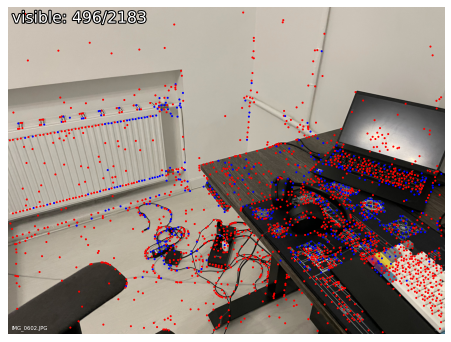

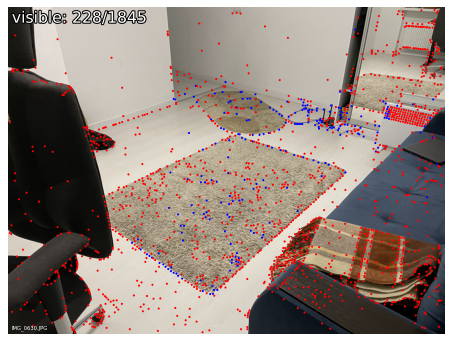

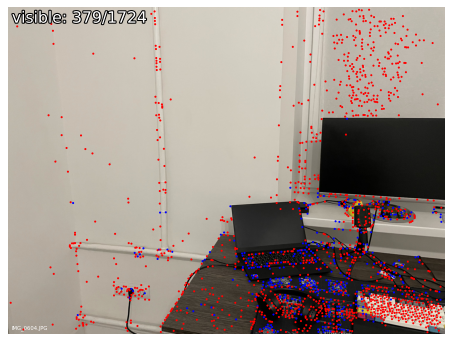

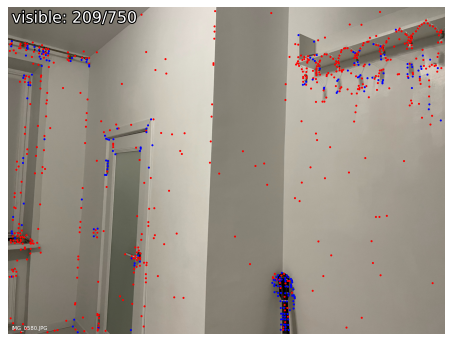

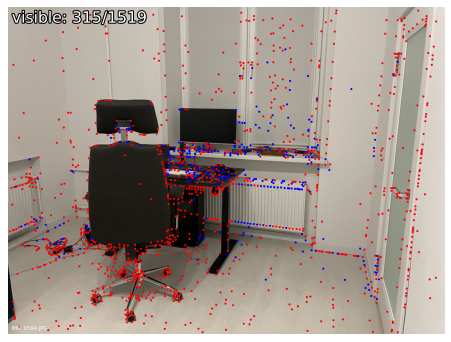

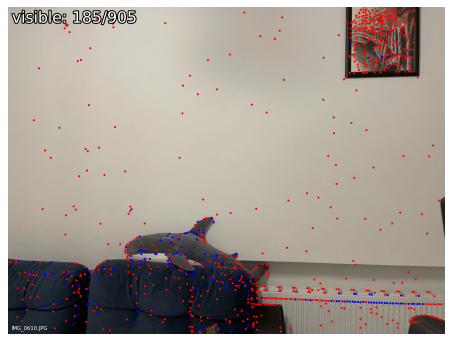

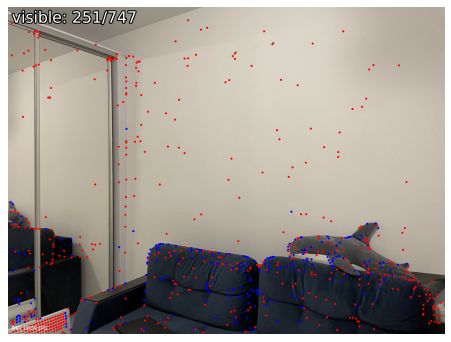

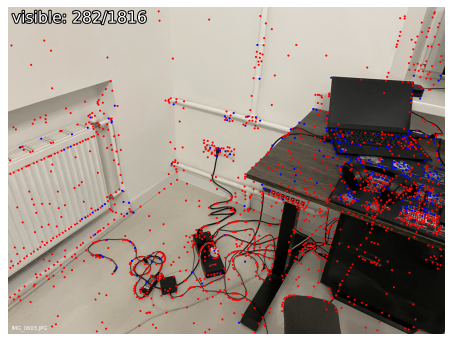

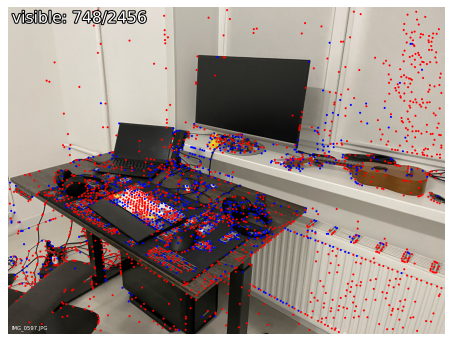

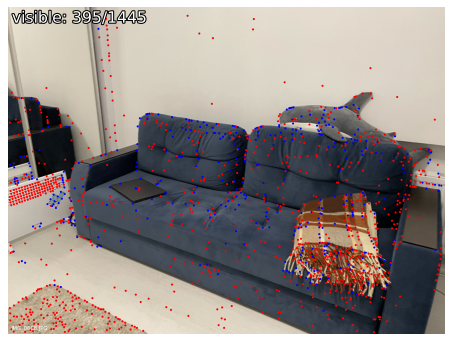

In [104]:
visualization.visualize_sfm_2d(sfm_dir, images, color_by='visibility', n=10)

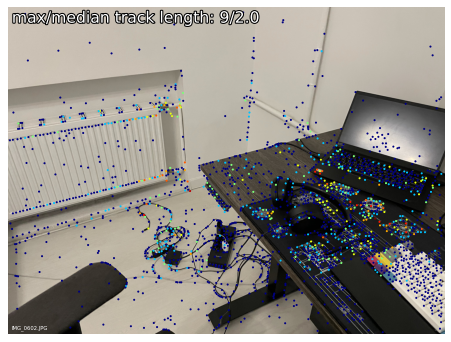

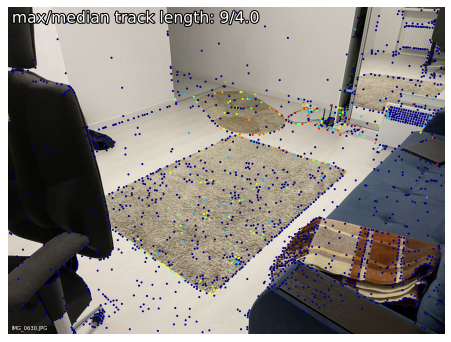

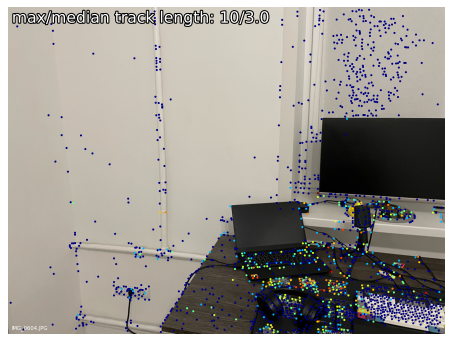

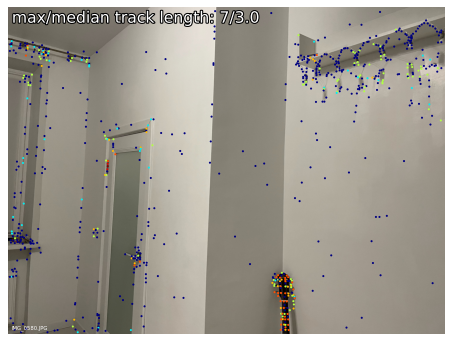

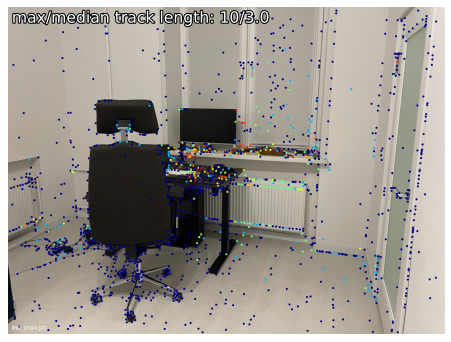

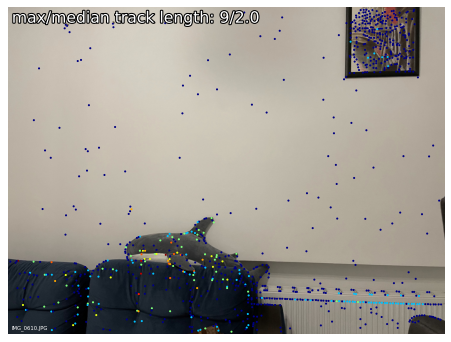

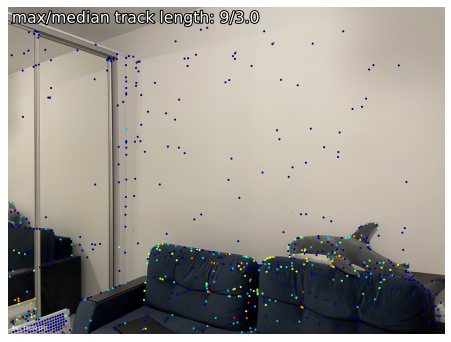

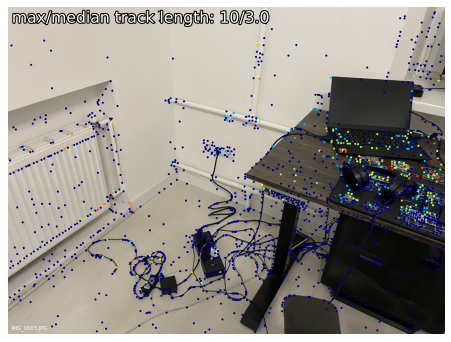

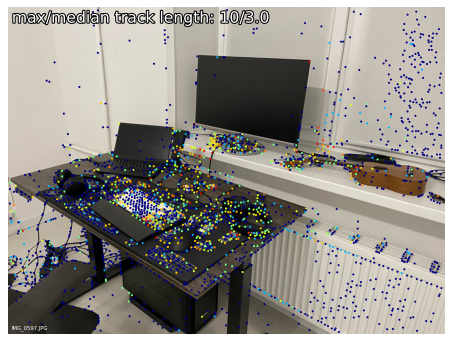

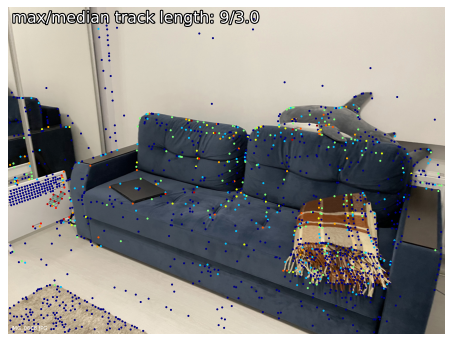

In [105]:
visualization.visualize_sfm_2d(sfm_dir, images, color_by='track_length', n=10)

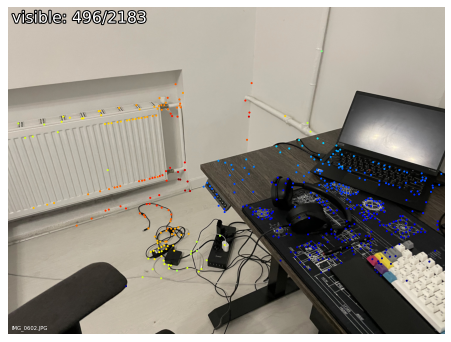

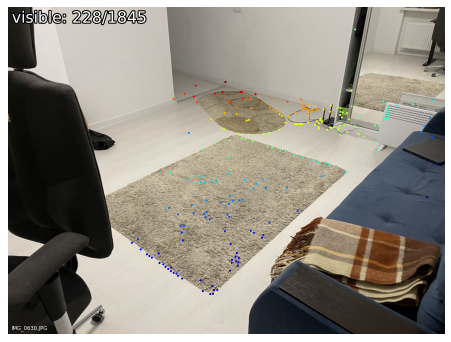

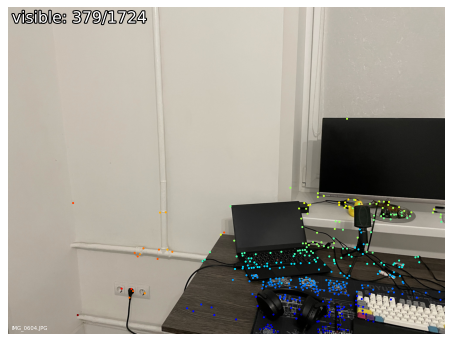

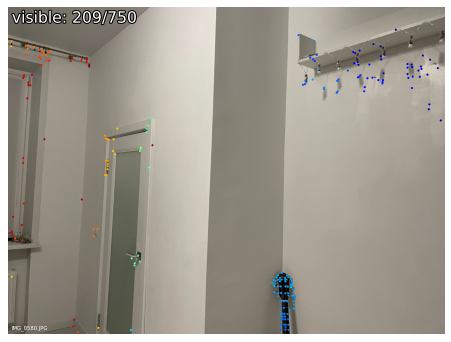

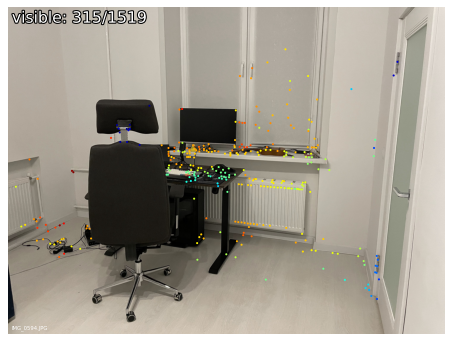

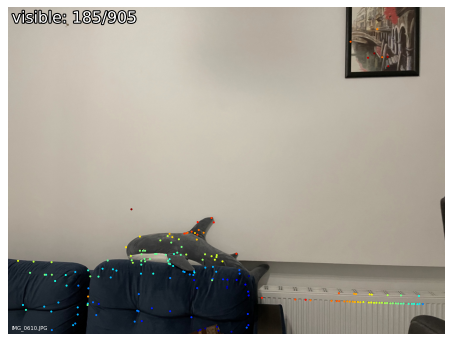

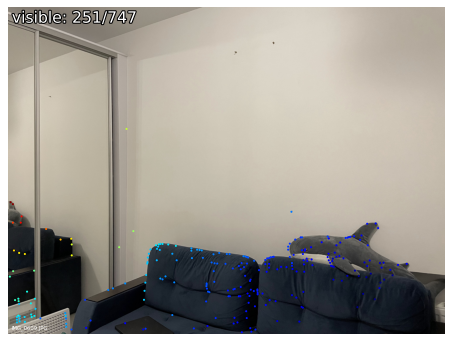

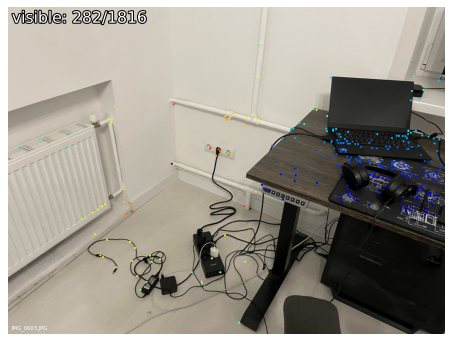

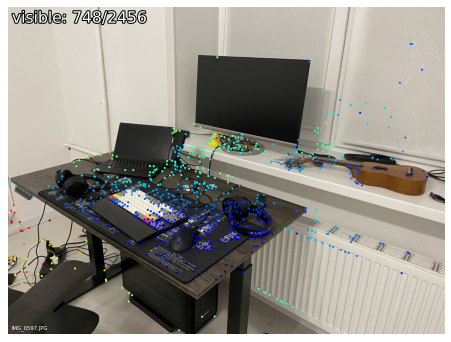

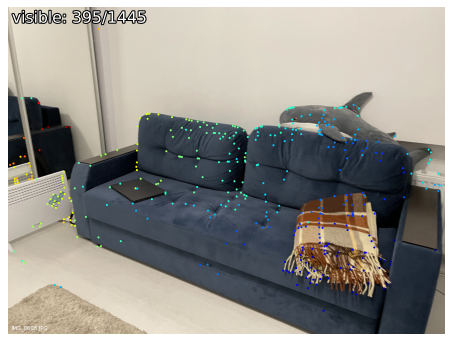

In [106]:
visualization.visualize_sfm_2d(sfm_dir, images, color_by='depth', n=10)

## Camera Intrinsics
Compare camera intrinsics figured by colmap with the original ones.

In [72]:
from hloc.utils.read_write_model import read_cameras_binary, read_images_binary

camera = read_cameras_binary(sfm_dir / 'cameras.bin')[1]

In [74]:
camera_model = (camera.model, camera.width, camera.height, camera.params)
camera_model

('SIMPLE_PINHOLE',
 4032,
 3024,
 array([3229.26967854, 2016.        , 1512.        ]))

In [75]:
#TODO: right parameters for iphone camera

## Move all images that were not used by colmap to ***query***

In [75]:
import os 
import shutil 

colmap_images = read_images_binary(sfm_dir / 'images.bin')
database_list = [colmap_images[i].name for i in colmap_images] 

for image in os.listdir(images):
    if image not in database_list:
        shutil.move(images / image, query / image)
        
database_list = [f'database/{i}' for i in database_list] 
query_list = [f'query/{i}' for i in os.listdir(query)] # as queries could originally contain some pics

In [76]:
database_list_path = dataset / 'database_list.txt'
with open(str(database_list_path), 'w') as f:
    for i in database_list:
        f.write(str(i) + '\n')
        
query_list_path = dataset / 'query_list.txt'
with open(str(query_list_path), 'w') as f:
    for i in query_list:
        f.write(str(i) + '\n')

## Extract global features

In [77]:
global_feature_path = extract_features.main(global_feature_conf, dataset, outputs, \
                                               feature_path=Path(outputs, global_feature_conf['output']+'.h5'))

[12/17/2021 22:30:36 INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[12/17/2021 22:30:36 INFO] Found 83 images in root datasets/uni.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 83/83 [03:06<00:00,  2.25s/it]

[12/17/2021 22:33:48 INFO] Finished exporting features.


## Generate localization pairs

In [78]:
from hloc import pairs_from_retrieval

pairs_from_retrieval.main(global_feature_path, 
                          loc_pairs, 40, 
                          query_list=query_list, 
                          db_list=database_list)

[12/17/2021 22:33:49 INFO] Extracting image pairs from a retrieval database.
[12/17/2021 22:33:49 INFO] Found 520 pairs.


## Extract local features for database and query images

In [79]:
local_feature_path = extract_features.main(local_feature_conf, dataset, outputs)

[12/17/2021 22:33:54 INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 4},
 'output': 'feats-superpoint-n4096-r1600',
 'preprocessing': {'grayscale': True, 'resize_max': 1600}}
[12/17/2021 22:33:54 INFO] Found 83 images in root datasets/uni.
Loaded SuperPoint model


  0%|                                                                                                                                                                               | 0/83 [00:00<?, ?it/s]/home/lizka/.local/lib/python3.8/site-packages/torch/nn/functional.py:4003: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 83/83 [03:08<00:00,  2.27s/it]

[12/17/2021 22:37:03 INFO] Finished exporting features.


## Match the query images

In [80]:
match_path = match_features.main(matcher_conf, loc_pairs, local_feature_conf['output'], outputs)

[12/17/2021 22:37:05 INFO] Matching local features with configuration:
{'model': {'name': 'superglue', 'sinkhorn_iterations': 50, 'weights': 'indoor'},
 'output': 'matches-superglue'}
Loaded SuperGlue model ("indoor" weights)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 520/520 [33:15<00:00,  3.84s/it]

[12/17/2021 23:10:20 INFO] Finished exporting matches.


## Localize!

In [102]:
localize_sfm.main(
    sfm_dir,
    query_list_path,
    loc_pairs,
    local_feature_path,
    match_path,
    camera_model,
    results,
    covisibility_clustering=False)  # not required with SuperPoint+SuperGlue

[12/17/2021 23:26:21 INFO] Imported 15 images from query_list.txt
[12/17/2021 23:26:21 INFO] Reading 3D model...
[12/17/2021 23:26:21 INFO] Starting localization...


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 46.95it/s]

[12/17/2021 23:26:21 INFO] Localized 15 / 15 images.
[12/17/2021 23:26:21 INFO] Writing poses to outputs/room/room_hloc_superpoint+superglue_netvlad40.txt...
[12/17/2021 23:26:21 INFO] Writing logs to outputs/room/room_hloc_superpoint+superglue_netvlad40.txt_logs.pkl...
[12/17/2021 23:26:21 INFO] Done!


## Visualizing the localization


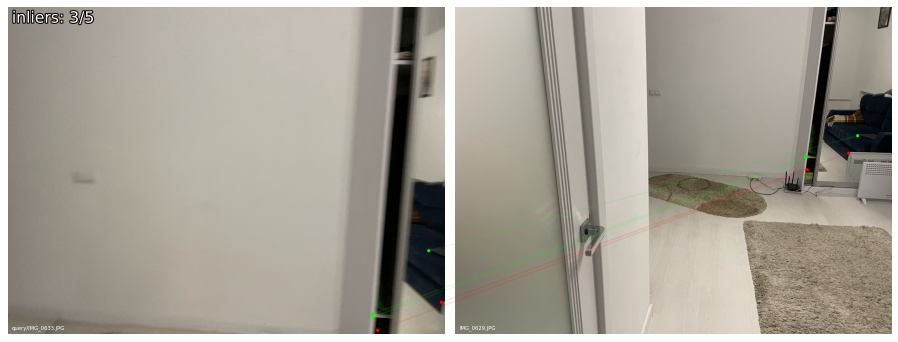

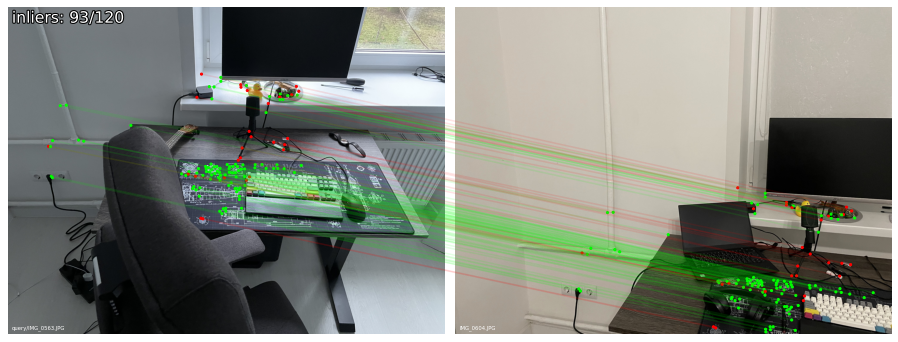

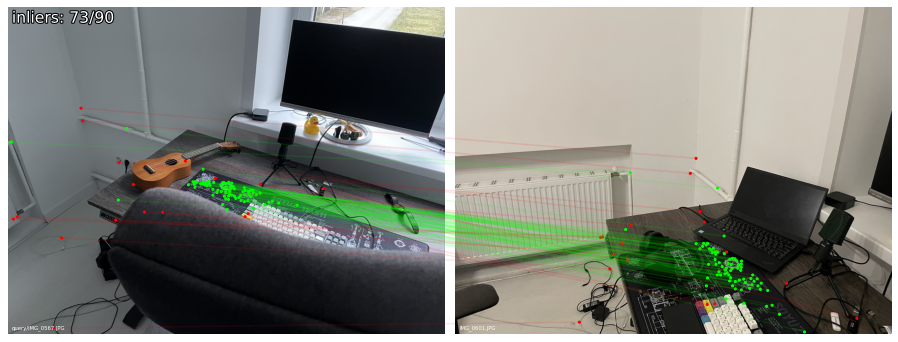

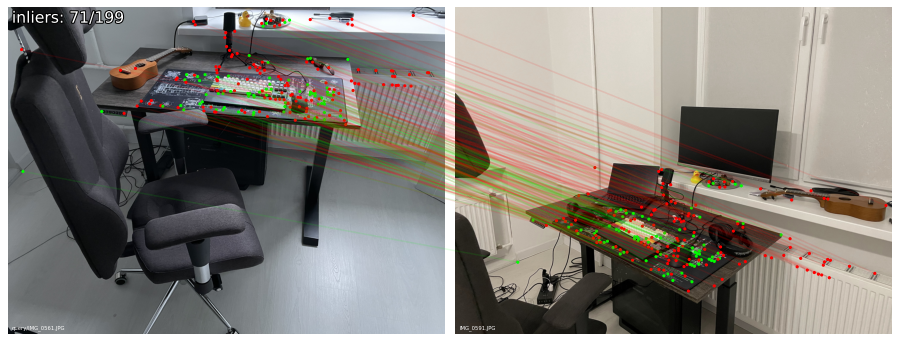

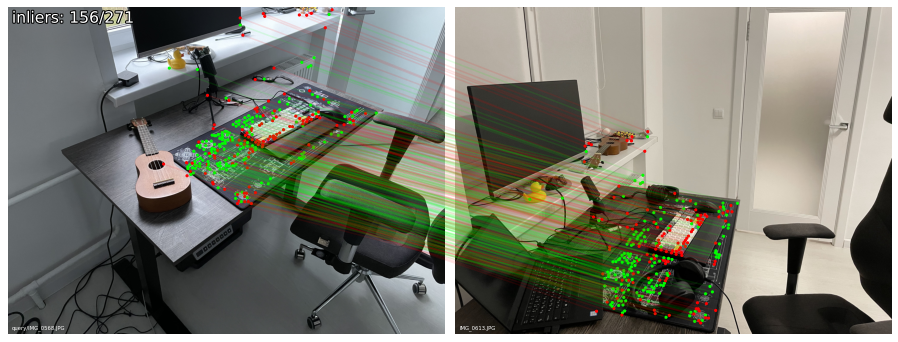

...

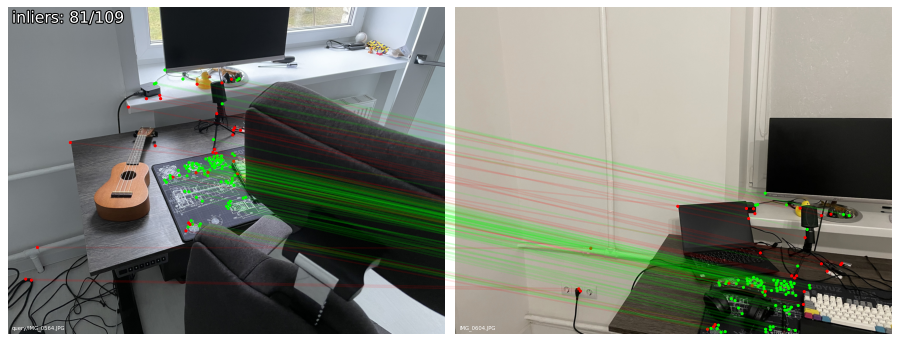

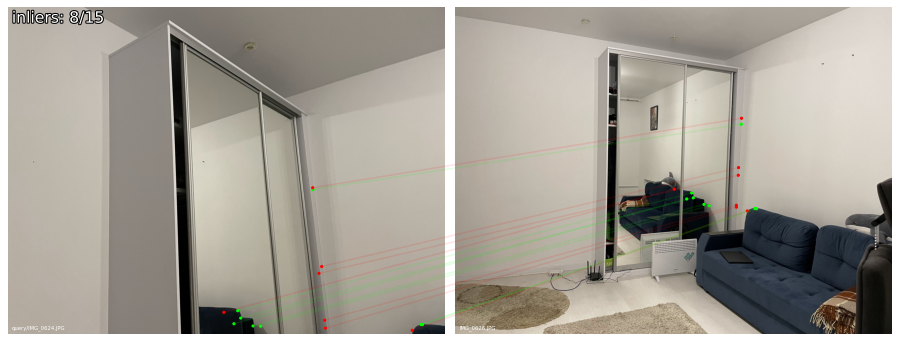

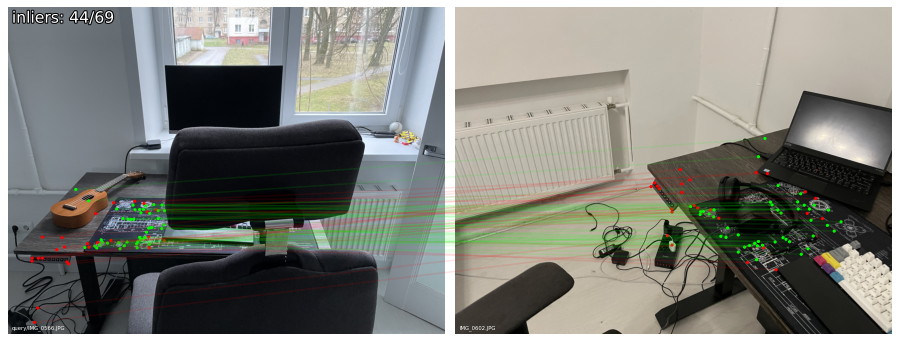

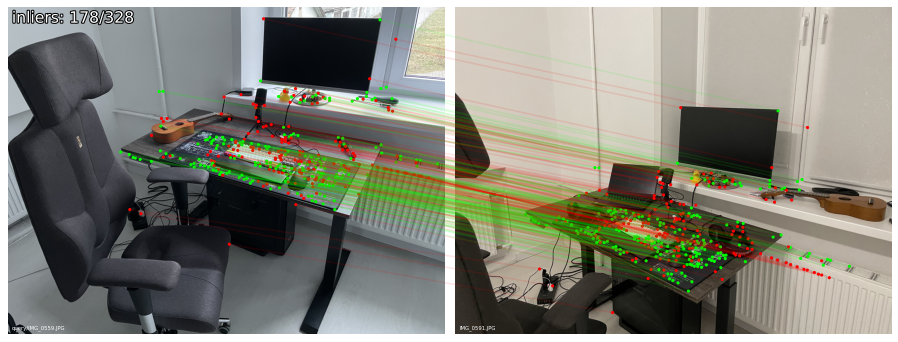

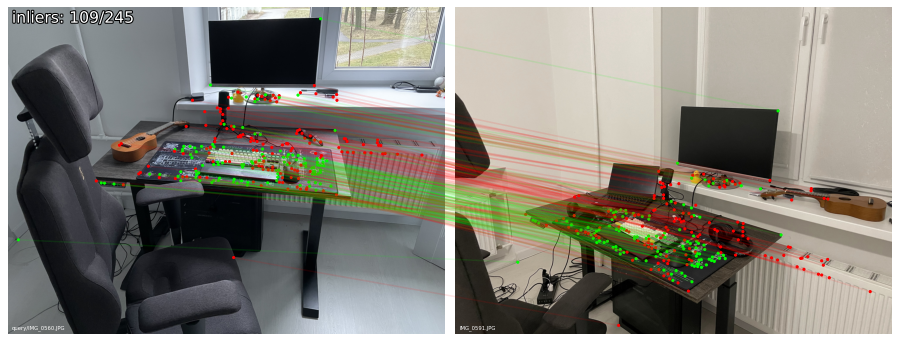

In [103]:
visualization.visualize_loc(
    results, dataset, sfm_dir, n=13, top_k_db=1, prefix='', seed=2, output_path=outputs)